In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt


In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))  # [-1,1]
])

dataset = torchvision.datasets.CIFAR10(
    root='./data',
    train=True,
    download=True,
    transform=transform
)

loader = torch.utils.data.DataLoader(dataset, batch_size=64, shuffle=True)


100%|██████████| 170M/170M [00:05<00:00, 30.2MB/s]


In [ ]:
class EncoderDecoder(nn.Module):
    def __init__(self):
        super().__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 128, 4, 2, 1),   # 32→16
            nn.ReLU(),

            nn.Conv2d(128, 256, 4, 2, 1), # 16→8
            nn.ReLU(),

            nn.Conv2d(256, 256, 4, 2, 1), # 8→4
            nn.ReLU()
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256,128,4,2,1), # 4→8
            nn.ReLU(),

            nn.ConvTranspose2d(128,64,4,2,1), # 8→16
            nn.ReLU(),

            nn.ConvTranspose2d(64,3,4,2,1), # 16→32
            nn.Tanh()
        )

    def forward(self,x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


In [ ]:
def to_gray(img):
    return img.mean(dim=1, keepdim=True)


In [ ]:
from tqdm import tqdm

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

model = EncoderDecoder().to(device)

criterion = nn.L1Loss()   # try MSE later
optimizer = optim.Adam(model.parameters(), lr=0.0002)

epochs = 10

for epoch in range(epochs):

    for imgs,_ in tqdm(loader):

        imgs = imgs.to(device)
        gray = to_gray(imgs)

        output = model(gray)

        loss = criterion(output, imgs)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1} Loss: {loss.item():.4f}")


100%|██████████| 782/782 [00:14<00:00, 52.90it/s]


Epoch 1 Loss: 0.1131


100%|██████████| 782/782 [00:13<00:00, 57.89it/s]


Epoch 2 Loss: 0.1251


100%|██████████| 782/782 [00:13<00:00, 57.59it/s]


Epoch 3 Loss: 0.1131


100%|██████████| 782/782 [00:13<00:00, 58.93it/s]


Epoch 4 Loss: 0.1160


100%|██████████| 782/782 [00:13<00:00, 59.62it/s]


Epoch 5 Loss: 0.1019


100%|██████████| 782/782 [00:20<00:00, 38.84it/s]


Epoch 6 Loss: 0.0921


100%|██████████| 782/782 [00:13<00:00, 59.28it/s]


Epoch 7 Loss: 0.1054


100%|██████████| 782/782 [00:13<00:00, 59.29it/s]


Epoch 8 Loss: 0.0973


100%|██████████| 782/782 [00:13<00:00, 59.41it/s]


Epoch 9 Loss: 0.1096


100%|██████████| 782/782 [00:13<00:00, 58.94it/s]

Epoch 10 Loss: 0.0803


In [ ]:
def show_images(gray, output, target):

    gray = gray[:6].cpu()
    output = output[:6].cpu()
    target = target[:6].cpu()

    output = (output + 1) / 2
    target = (target + 1) / 2

    fig, ax = plt.subplots(3,6, figsize=(12,6))

    for i in range(6):
        ax[0,i].imshow(gray[i].permute(1,2,0).squeeze(), cmap='gray')
        ax[1,i].imshow(output[i].permute(1,2,0))
        ax[2,i].imshow(target[i].permute(1,2,0))

        ax[0,i].axis('off')
        ax[1,i].axis('off')
        ax[2,i].axis('off')

    ax[0,0].set_ylabel("Input")
    ax[1,0].set_ylabel("Output")
    ax[2,0].set_ylabel("Target")

    plt.show()


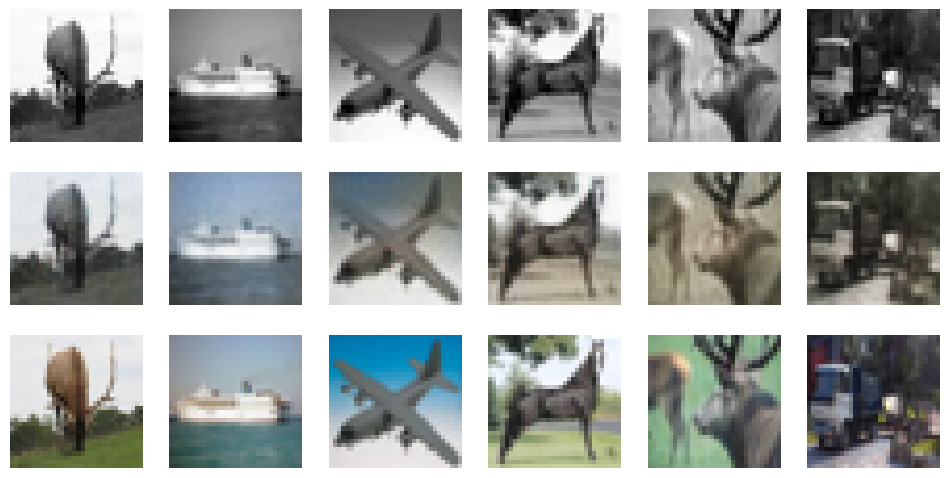

In [ ]:
imgs,_ = next(iter(loader))
imgs = imgs.to(device)
gray = to_gray(imgs)

with torch.no_grad():
    out = model(gray)

show_images(gray, out, imgs)


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


--- Multi-Prompt Generator (Running on cuda) ---


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--timbrooks--instruct-pix2pix/snapshots/31519b5cb02a7fd89b906d88731cd4d6a7bbf88d/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loaded image. Processing 11 prompts...

🎨 Generating 1/11: 'make me sit in open mountains'...


  0%|          | 0/40 [00:00<?, ?it/s]

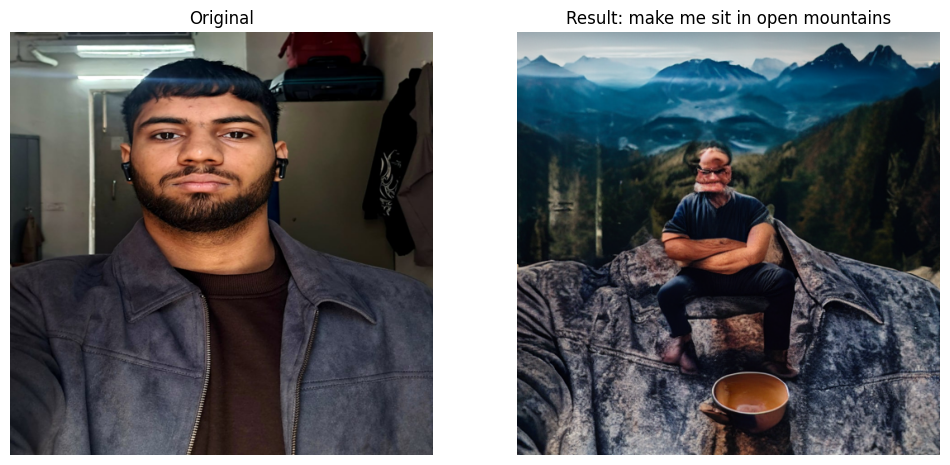

✅ Saved to output_0_make_me_si.png
----------------------------------------
🎨 Generating 2/11: 'make me sit in a modern classroom'...


  0%|          | 0/40 [00:00<?, ?it/s]

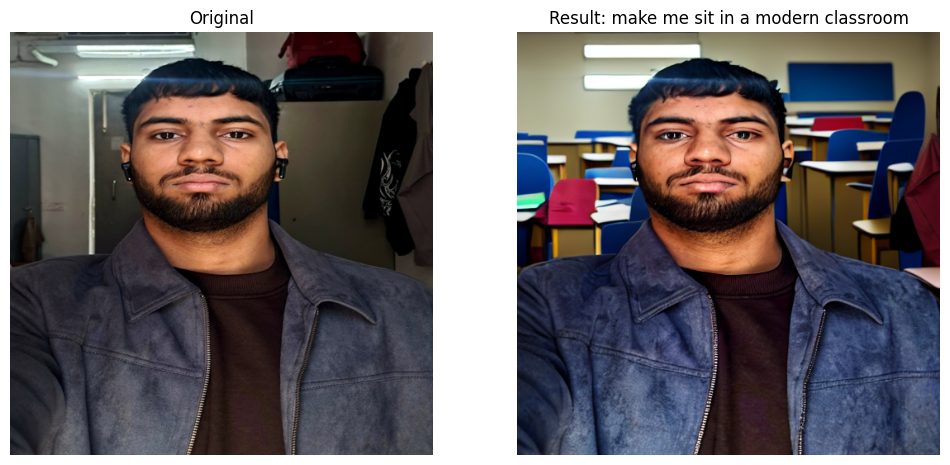

✅ Saved to output_1_make_me_si.png
----------------------------------------
🎨 Generating 3/11: 'turn the background into a cyberpunk city'...


  0%|          | 0/40 [00:00<?, ?it/s]

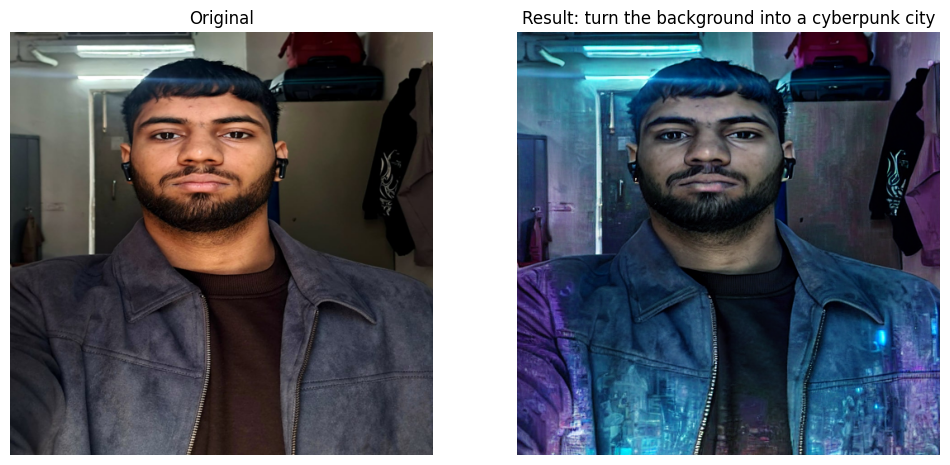

✅ Saved to output_2_turn_the_b.png
----------------------------------------
🎨 Generating 4/11: 'make it look like a pencil sketch'...


  0%|          | 0/40 [00:00<?, ?it/s]

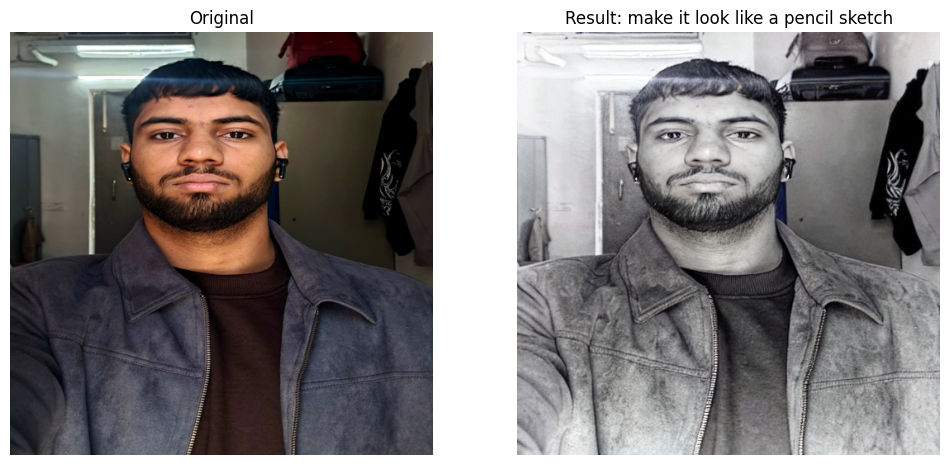

✅ Saved to output_3_make_it_lo.png
----------------------------------------
🎨 Generating 5/11: 'Make me fly through sahara desert'...


  0%|          | 0/40 [00:00<?, ?it/s]

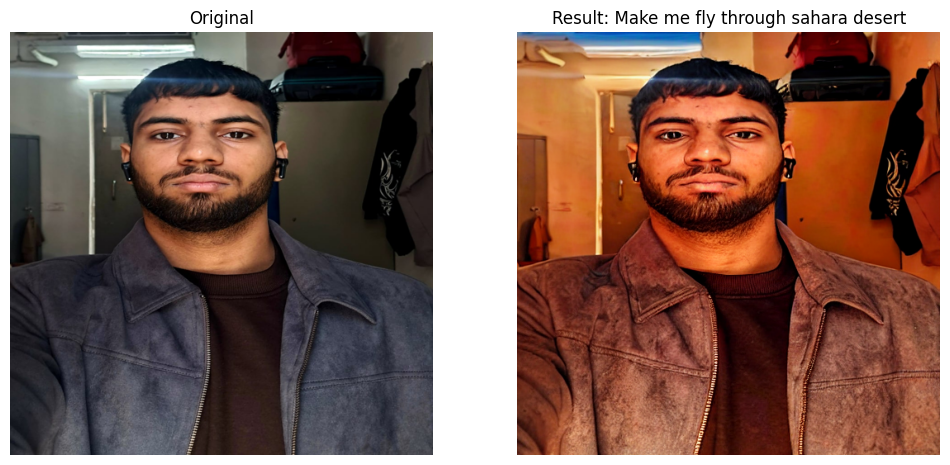

✅ Saved to output_4_Make_me_fl.png
----------------------------------------
🎨 Generating 6/11: 'Make 2 balloons grow on the head'...


  0%|          | 0/40 [00:00<?, ?it/s]

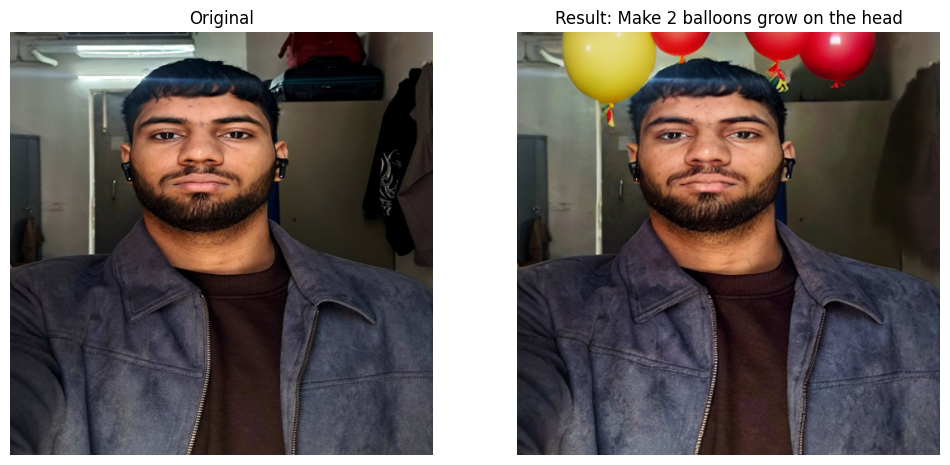

✅ Saved to output_5_Make_2_bal.png
----------------------------------------
🎨 Generating 7/11: 'Make me sit in cafe drinking coffee'...


  0%|          | 0/40 [00:00<?, ?it/s]

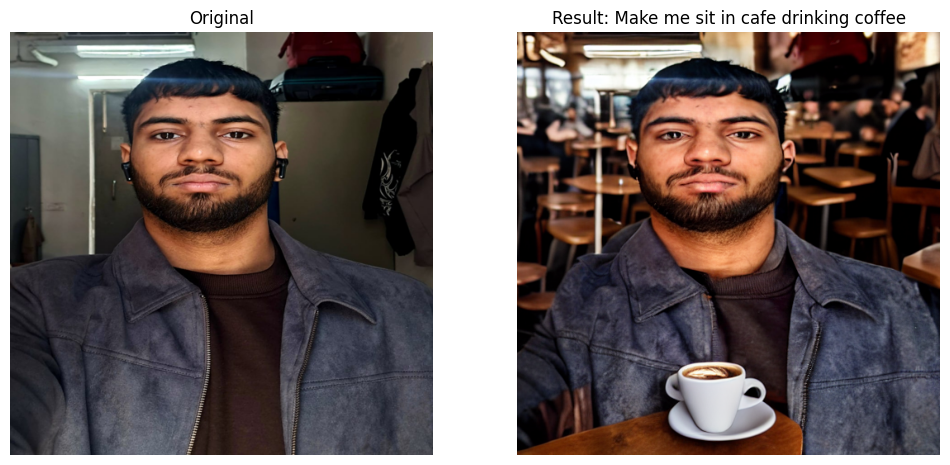

✅ Saved to output_6_Make_me_si.png
----------------------------------------
🎨 Generating 8/11: 'Make me study under the moon'...


  0%|          | 0/40 [00:00<?, ?it/s]

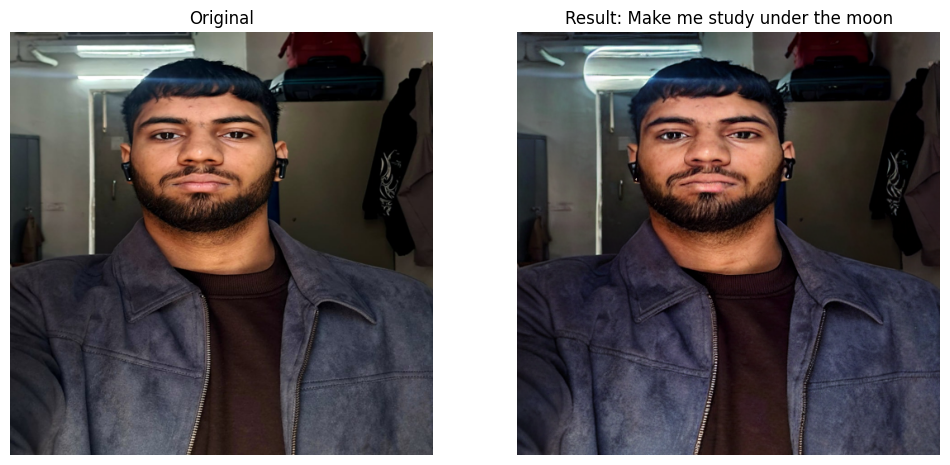

✅ Saved to output_7_Make_me_st.png
----------------------------------------
🎨 Generating 9/11: 'Make me hospitalized in hospital bned'...


  0%|          | 0/40 [00:00<?, ?it/s]

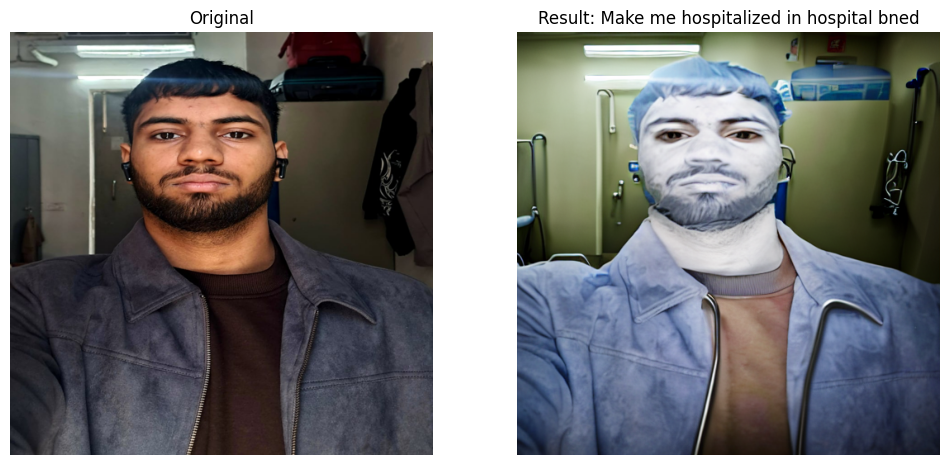

✅ Saved to output_8_Make_me_ho.png
----------------------------------------
🎨 Generating 10/11: 'Make me drive a supercar'...


  0%|          | 0/40 [00:00<?, ?it/s]

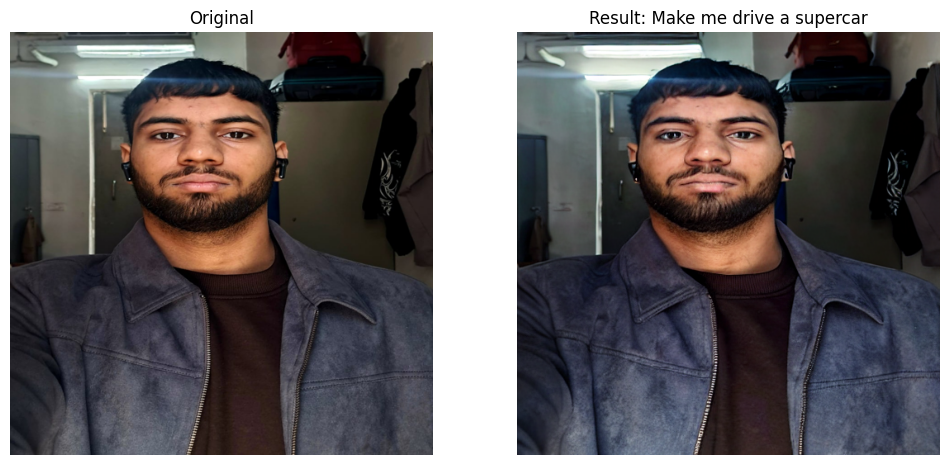

✅ Saved to output_9_Make_me_dr.png
----------------------------------------
🎨 Generating 11/11: 'Make me ride a superbike'...


  0%|          | 0/40 [00:00<?, ?it/s]

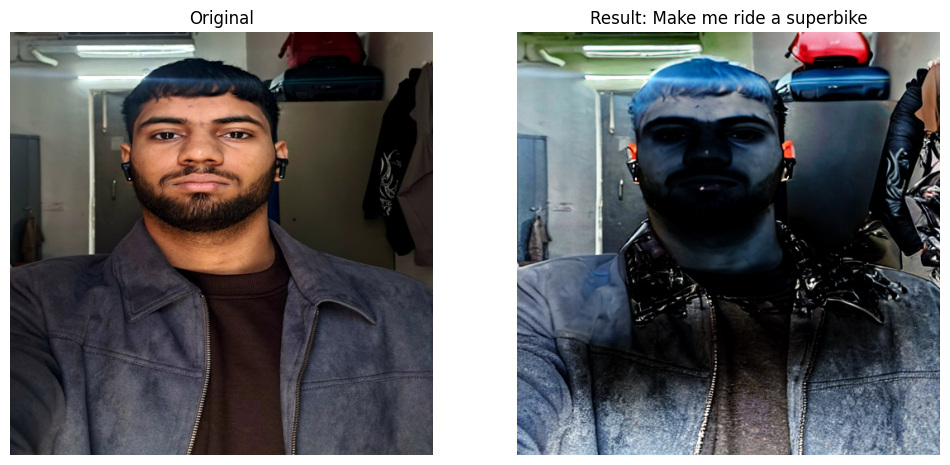

✅ Saved to output_10_Make_me_ri.png
----------------------------------------
All done!


In [ ]:
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
import matplotlib.pyplot as plt
import os

# ==========================================
# 1. USER SETTINGS
# ==========================================
INPUT_IMAGE = "/content/WhatsApp Image 2026-01-15 at 23.40.09 (1).jpeg"  # Ensure this file exists in the folder

# List of prompts to generate
PROMPT_LIST = [
    "make me sit in open mountains",
    "make me sit in a modern classroom",
    "turn the background into a cyberpunk city",
    "make it look like a pencil sketch",
    "Make me fly through sahara desert",
    "Make 2 balloons grow on the head",
    "Make me sit in cafe drinking coffee",
    "Make me study under the moon",
    "Make me hospitalized in hospital bned",
    "Make me drive a supercar",
    "Make me ride a superbike"

]

# Tuning Knobs
IMAGE_STABILITY = 2  # 1.5 is balanced. Higher = keeps face better.
TEXT_STRENGTH = 10.0    # How strongly to apply the prompt.

# ==========================================
# 2. Setup Model & Hardware
# ==========================================
device = "cuda" if torch.cuda.is_available() else "cpu"
dtype = torch.float16 if device == "cuda" else torch.float32

print(f"--- Multi-Prompt Generator (Running on {device}) ---")

# Load Model
model_id = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(
    model_id, torch_dtype=dtype, safety_checker=None
).to(device)
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)



Loaded image. Processing 11 prompts...

🎨 Generating 1/11: 'make me sit in open mountains'...


  0%|          | 0/40 [00:00<?, ?it/s]

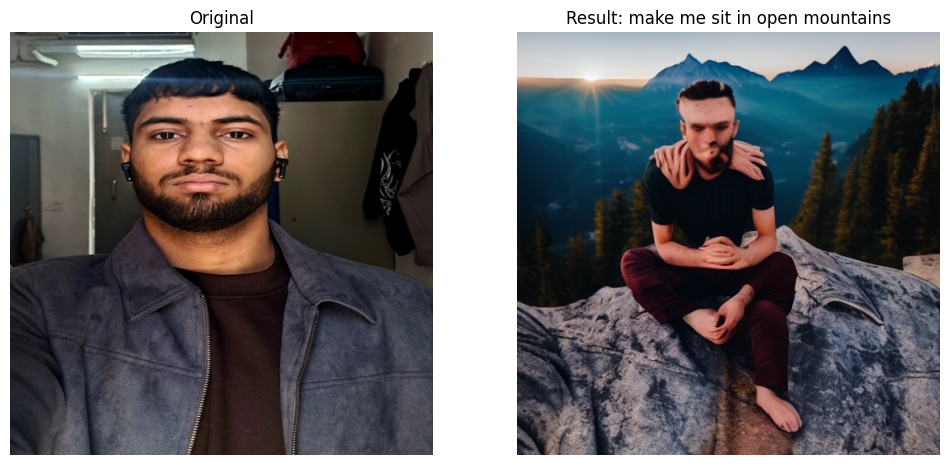

✅ Saved to output_0_make_me_si.png
----------------------------------------
🎨 Generating 2/11: 'make me sit in a modern classroom'...


  0%|          | 0/40 [00:00<?, ?it/s]

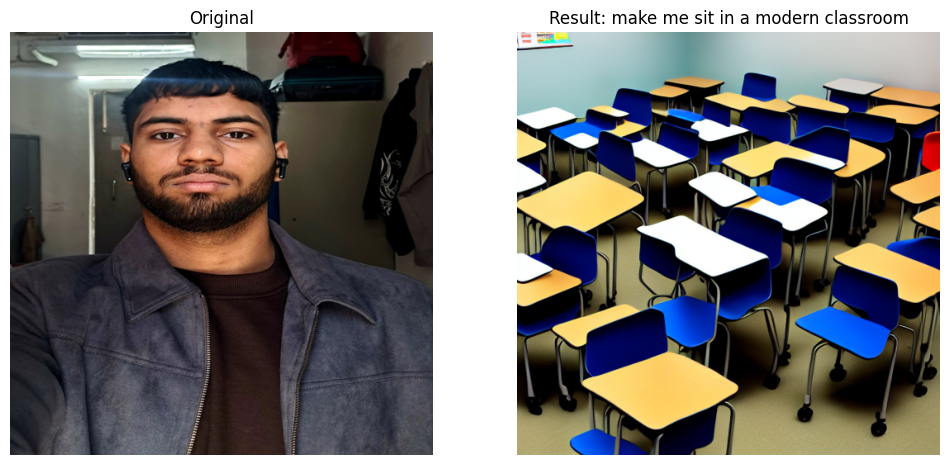

✅ Saved to output_1_make_me_si.png
----------------------------------------
🎨 Generating 3/11: 'turn the background into a cyberpunk city'...


  0%|          | 0/40 [00:00<?, ?it/s]

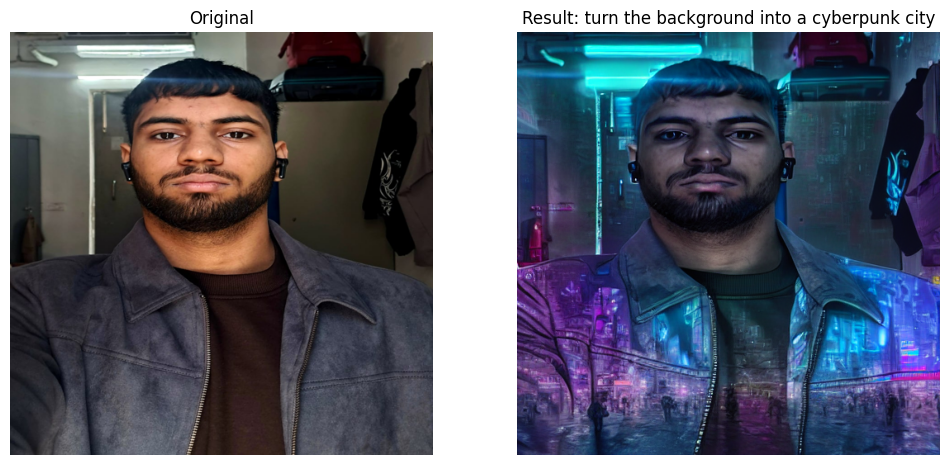

✅ Saved to output_2_turn_the_b.png
----------------------------------------
🎨 Generating 4/11: 'make it look like a pencil sketch'...


  0%|          | 0/40 [00:00<?, ?it/s]

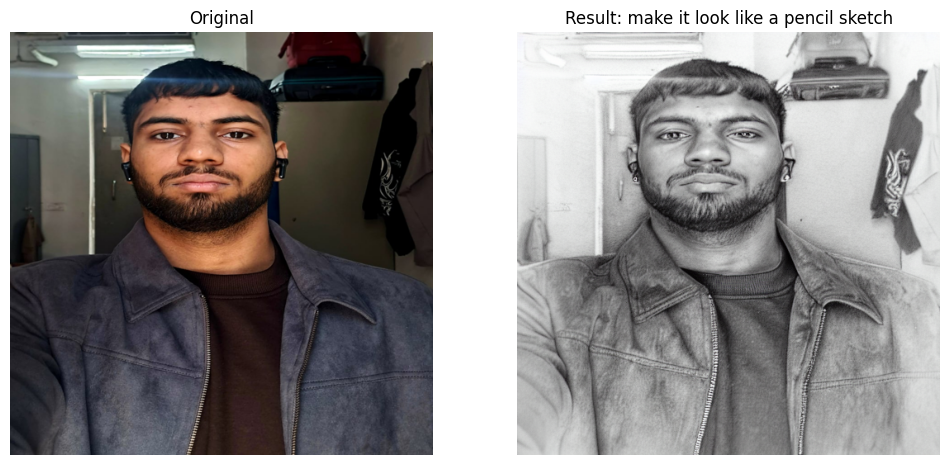

✅ Saved to output_3_make_it_lo.png
----------------------------------------
🎨 Generating 5/11: 'Make me fly through sahara desert'...


  0%|          | 0/40 [00:00<?, ?it/s]

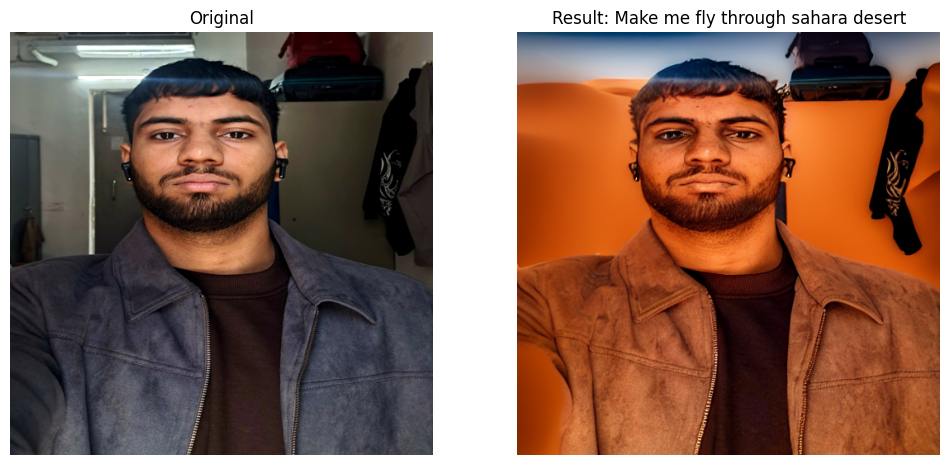

✅ Saved to output_4_Make_me_fl.png
----------------------------------------
🎨 Generating 6/11: 'Make 2 balloons grow on the head'...


  0%|          | 0/40 [00:00<?, ?it/s]

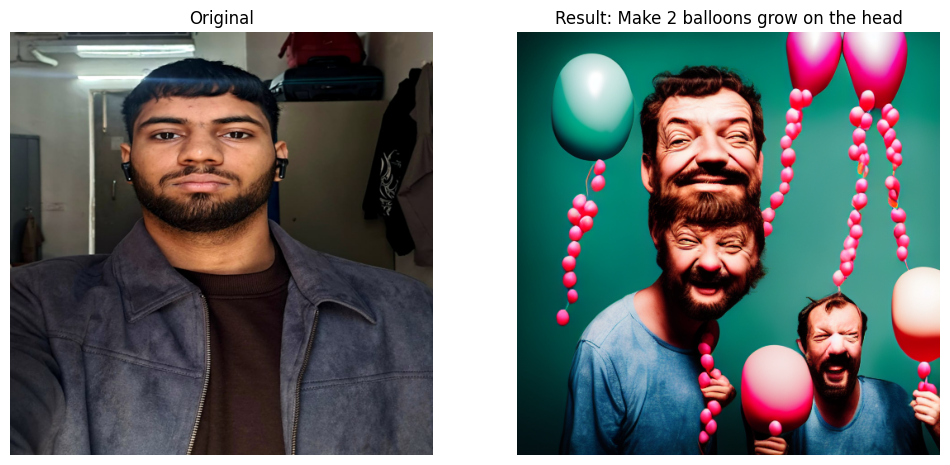

✅ Saved to output_5_Make_2_bal.png
----------------------------------------
🎨 Generating 7/11: 'Make me sit in cafe drinking coffee'...


  0%|          | 0/40 [00:00<?, ?it/s]

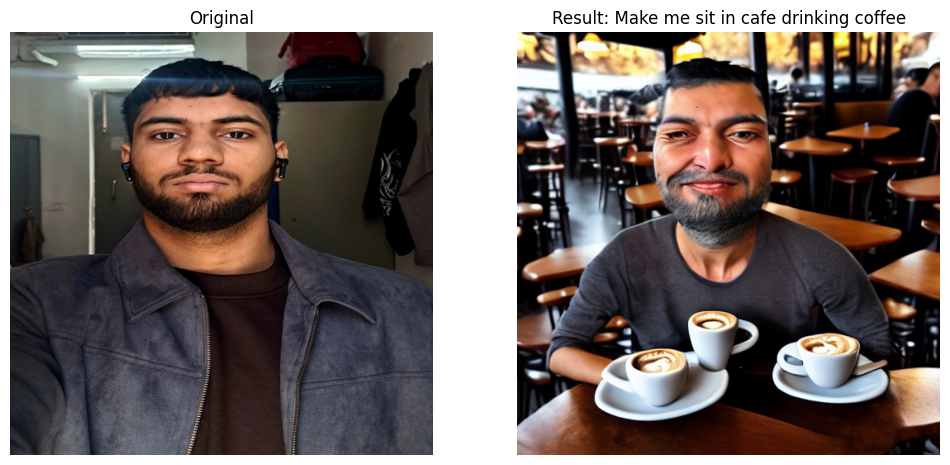

✅ Saved to output_6_Make_me_si.png
----------------------------------------
🎨 Generating 8/11: 'Make me study under the moon'...


  0%|          | 0/40 [00:00<?, ?it/s]

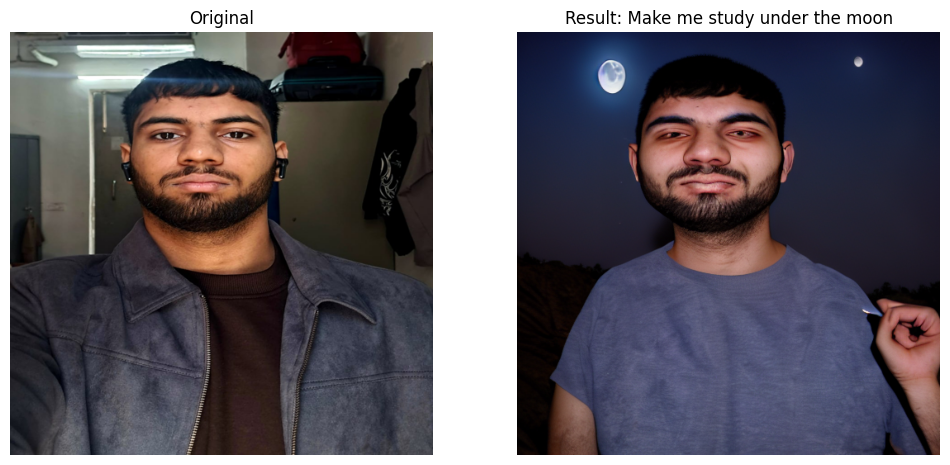

✅ Saved to output_7_Make_me_st.png
----------------------------------------
🎨 Generating 9/11: 'Make me hospitalized in hospital bned'...


  0%|          | 0/40 [00:00<?, ?it/s]

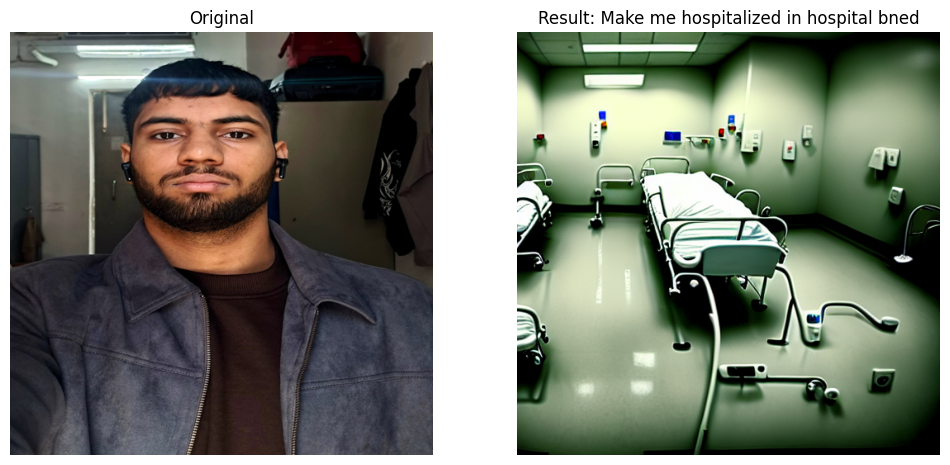

✅ Saved to output_8_Make_me_ho.png
----------------------------------------
🎨 Generating 10/11: 'Make me drive a supercar'...


  0%|          | 0/40 [00:00<?, ?it/s]

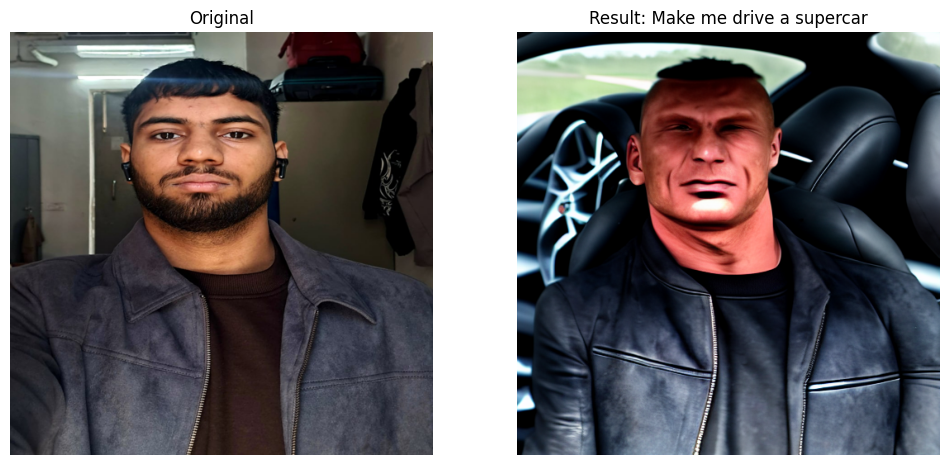

✅ Saved to output_9_Make_me_dr.png
----------------------------------------
🎨 Generating 11/11: 'Make me ride a superbike'...


  0%|          | 0/40 [00:00<?, ?it/s]

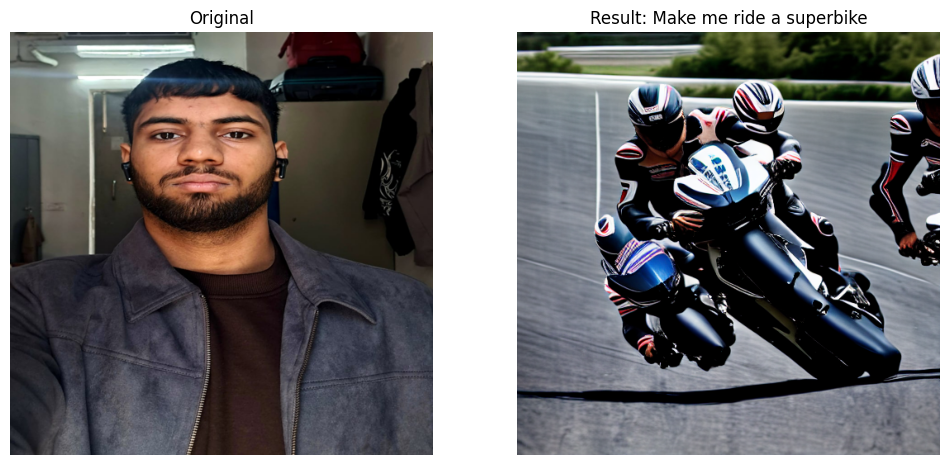

✅ Saved to output_10_Make_me_ri.png
----------------------------------------
All done!


In [ ]:
# Tuning Knobs
IMAGE_STABILITY = 1.6  # 1.5 is balanced. Higher = keeps face better.
TEXT_STRENGTH = 15    # How strongly to apply the prompt.


if not os.path.exists(INPUT_IMAGE):
    print(f"❌ Error: Could not find '{INPUT_IMAGE}'.")
    exit()

original_image = Image.open(INPUT_IMAGE).convert("RGB")
original_image = original_image.resize((512, 512))

# ==========================================
# 3. The Loop (Generate & Display)
# ==========================================
print(f"Loaded image. Processing {len(PROMPT_LIST)} prompts...\n")

for i, prompt in enumerate(PROMPT_LIST):
    print(f"🎨 Generating {i+1}/{len(PROMPT_LIST)}: '{prompt}'...")

    # Generate
    with torch.no_grad():
        result = pipe(
            prompt,
            image=original_image,
            num_inference_steps=40,
            image_guidance_scale=IMAGE_STABILITY,
            guidance_scale=TEXT_STRENGTH
        ).images[0]

    # Save locally
    filename = f"output_{i}_{prompt[:10].replace(' ', '_')}.png"
    result.save(filename)

    # --- DISPLAY INLINE (The "There Only" Part) ---
    plt.figure(figsize=(12, 6))

    # Left: Original
    plt.subplot(1, 2, 1)
    plt.imshow(original_image)
    plt.title("Original")
    plt.axis("off")

    # Right: Generated
    plt.subplot(1, 2, 2)
    plt.imshow(result)
    plt.title(f"Result: {prompt}")
    plt.axis("off")

    plt.show() # <--- This forces the image to appear in the output immediately
    print(f"✅ Saved to {filename}\n" + "-"*40)

print("All done!")